In [ ]:
# Import TensorFLow
import tensorflow as tf
import tensorflow_hub as hub
print("TF version",tf.__version__)
print("TF Hub Version",hub.__version__)

# Check GPU availablity
print("GPU","available" if tf.config.list_physical_devices("GPU") else "not available")

TF version 2.12.0
TF Hub Version 0.13.0
GPU available


In [ ]:
#!unzip "drive/MyDrive/DogVision/dog-breed-identification.zip" -d "drive/MyDrive/DogVision"

## Getting our data ready (turning into tensors)

With all ML model our data has to be numerical so we convert images to Tensor
So start by accessing data and checking our label

In [ ]:
# Checkout label as data
import pandas as pd
labels_csv=pd.read_csv("drive/MyDrive/DogVision/dog-breed-identification/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

<Axes: >

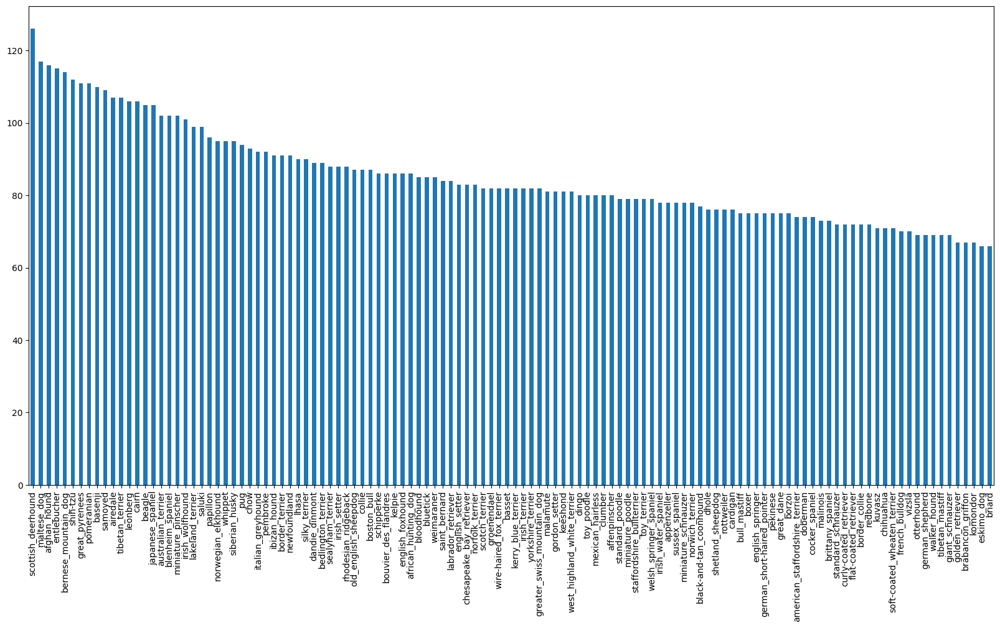

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

In [ ]:
labels_csv["breed"].value_counts().mean()

85.18333333333334

In [ ]:
labels_csv["breed"].value_counts().min()

66

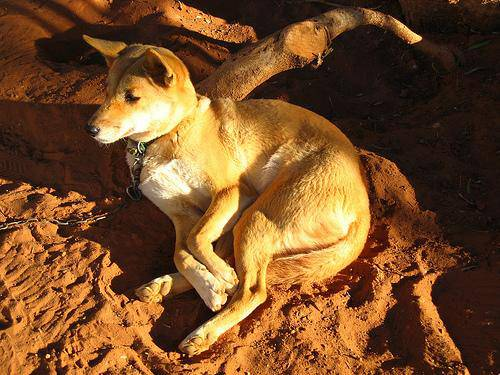

In [ ]:
# Lets veiw an image
from IPython.display import Image
Image("drive/MyDrive/DogVision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels
Let get a list of all of our image file pathnames

In [ ]:
# Create pathnames from image id
filenames=["drive/MyDrive/DogVision/dog-breed-identification/train/"+fname for fname in labels_csv["id"]+".jpg"]
filenames[:10]

['drive/MyDrive/DogVision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/DogVision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/DogVision/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/DogVision/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/DogVision/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/DogVision/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/DogVision/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/DogVision/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/DogVision/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/DogVision/dog-breed-identification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether no. of column name matches actual image file
import os
if len(os.listdir("drive/MyDrive/DogVision/dog-breed-identification/train"))==len(filenames):
  print("Filename match actual amount of files")
else:
  print("Filenames do not match")

Filename match actual amount of files


In [ ]:
import os
os.listdir("drive/MyDrive/DogVision/dog-breed-identification/train")[:10]

['e86f7777b271c54f7d0d6a228637c8d3.jpg',
 'dcda81d6b22e37e4c0fc36a383a61e73.jpg',
 'e34ee9dce9546a1b520c1c8a3badb605.jpg',
 'e5da6d29569d6d93ae3e0d04f35ab9b9.jpg',
 'de1f5f90eed51d8229d197a91d35f4d4.jpg',
 'e073b458a33cbfe9b733764a1246f52e.jpg',
 'e4fe0acc8e0372aae5d0b0817e70bdef.jpg',
 'e88f4a70305e582965569c4ca91c34b8.jpg',
 'dd79ba1404da7aa15471494d11657b68.jpg',
 'dc068bd9527c4b3d7cf62fa73ae23bbe.jpg']

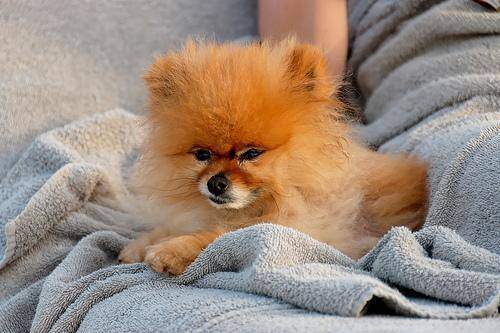

In [ ]:
Image(filenames[8000])

In [ ]:
labels_csv["breed"][8000]

'pomeranian'


Lets prepare labels as we have training images filepaths in list



In [ ]:
import numpy as np
labels=labels_csv["breed"]
labels

0                     boston_bull
1                           dingo
2                        pekinese
3                        bluetick
4                golden_retriever
                   ...           
10217                      borzoi
10218              dandie_dinmont
10219                    airedale
10220          miniature_pinscher
10221    chesapeake_bay_retriever
Name: breed, Length: 10222, dtype: object

In [ ]:
labels=np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# see missing data
if(len(labels)==len(filenames)):
  print("No missing data")
else:
  print("Missing data")

No missing data


Since ML model cant take string input so convert to numeruc data

In [ ]:
# Find the unique label
unique_breed=np.unique(labels)
len(unique_breed)

120

In [ ]:
# Turn a single label into an array of boolean
print(labels[0])
labels[0] == unique_breed

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label to boolean array
boolean_labels=[label == unique_breed for label in labels]
len(boolean_labels)

10222

In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Example turning boolean array to integers
print(labels[0])# original label
print(np.where(unique_breed==labels[0]))# index where label occurs
print(boolean_labels[0].argmax()) # index where label in boolean array
print(boolean_labels[0].astype(int))# there will be a ! whwre sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since dataset doesn't come with validation set, we are going to make our own

In [ ]:
# Set up Xand y
X=filenames
y=boolean_labels

In [ ]:
len(X),len(y)

(10222, 10222)

We are going to start off experimenting with ~1000 images and increase as needed

In [ ]:
# Set number of images to use for experiment
NUM_IMAGES = 1000 #@param{type:"slider",min:100,max:10000,step:1000}

In [ ]:
# Let split data into train and validation set
from sklearn.model_selection import train_test_split

# Split them into training and validation of size NUM_IMAGES
X_train,X_val,y_train,y_val=train_test_split(X[:NUM_IMAGES],
                                             y[:NUM_IMAGES],
                                             test_size=0.2,
                                             random_state=42)
len(X_train),len(X_val),len(y_train),len(y_val)

(800, 200, 800, 200)

In [ ]:
# Lets have  look at taining data
X_train[:3],y_train[:3]

(['drive/MyDrive/DogVision/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/DogVision/dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/DogVision/dog-breed-identification/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fa

## Preprocessing images (Convert to tensors)
To preprocess images into tensors we will make a function
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable `image`
3. Turn our `imag` (jpg) to tensor
4. Normalize our image(0-225 to 0-1)
4. Resize the `image` to shape(224,224)
5. Return the modified image

Bbefore we do,lets see what importing an image looks like

In [ ]:
# Convert image to Numpy
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image[:2],image.max(),image.min()

(array([[[ 89, 137,  87],
         [ 76, 124,  74],
         [ 63, 111,  59],
         ...,
         [ 76, 134,  86],
         [ 76, 134,  86],
         [ 76, 134,  86]],
 
        [[ 72, 119,  73],
         [ 67, 114,  68],
         [ 63, 111,  63],
         ...,
         [ 75, 131,  84],
         [ 74, 132,  84],
         [ 74, 131,  86]]], dtype=uint8),
 255,
 0)

In [ ]:
tf.constant(image)[:2] # COnvert image to tensor

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

##### Function to preprocess the images

In [ ]:
# Define image size
IMG_SIZE=224

#create a function for preprocessing images

def process_image(image_path):
  # Read in an image file
  image=tf.io.read_file(image_path)
  #Turn the jpg image to numerical Tensor with 3 colur channel(RGB)
  image=tf.image.decode_jpeg(image,channels=3)
  # Convert to colour channel values from 0-225 to 0-1 value
  image=tf.image.convert_image_dtype(image,tf.float32)
  # Resize shape
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image

In [ ]:
# tensor=tf.io.read_file(filenames[26])
# tensor

In [ ]:
#  tensor=tf.image.decode_jpeg(tensor,channels=3)

In [ ]:
# tf.image.convert_image_dtype(tensor,tf.float32)

## Turning our data into batches

Why turn data into batches?

if u try to process 10000+ image in one go..memory fit issues

So that why we do about 32(default batch size) images at a time

In order to use TensorFlow effectively we need our data in the form of Tensor tuples which looks like `(image,label)`

In [ ]:
# Create a function to return a tuple of (image,label)
def get_image_label(image_path,label):
  image=process_image(image_path)
  return image,label

In [ ]:
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we have a wy to turn data into tuple of tensors let make a function to turn data into batches

In [ ]:
# Define batch size
BATCH_SIZE=32
# Create a function to turn data into batches
def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Create batches of data out of image (X) and label (y) pairs
  Shuffles the data if its training data not validation data
  Also accept test data as labels
  """
  # If data is a test dataset,we probably has no label
  if test_data:
    print("Creating test data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X))) #only filepaths(no label)
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  #If data is valid dataset no need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X) #filepath
                                            ,tf.constant(y))) # label
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data=tf.data.Dataset.from_tensor_slices(((tf.constant(X)),
                                            tf.constant(y)))

    # Shuffling pathname and label before mapping image processor function is faster than shuffeling images
    data=data.shuffle(buffer_size=len(X))

    # Create (image,label) tuple
    data=data.map(get_image_label)

    data_batch=data.batch(BATCH_SIZE)
    return data_batch

In [ ]:
# Creating training and validation data bathces
train_data=create_data_batches(X_train,y_train)
val_data=create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Checkout different sttribute of data_batches
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches


In [ ]:
import matplotlib.pyplot as plt

# cerate a function for veiwig images in data batch
def show_25_images(images,labels):
  # Setup figure
  plt.figure(figsize=(10,15))
  for i in range(25):
    ax=plt.subplot(5,5,i+1) # row,column,index
    # display image
    plt.imshow(images[i])
    plt.title(unique_breed[labels[i].argmax()])


In [ ]:
unique_breed[y[0].argmax()]

'boston_bull'

In [ ]:
train_images,train_labels=next(train_data.as_numpy_iterator())
len(train_images),len(train_labels)

(32, 32)

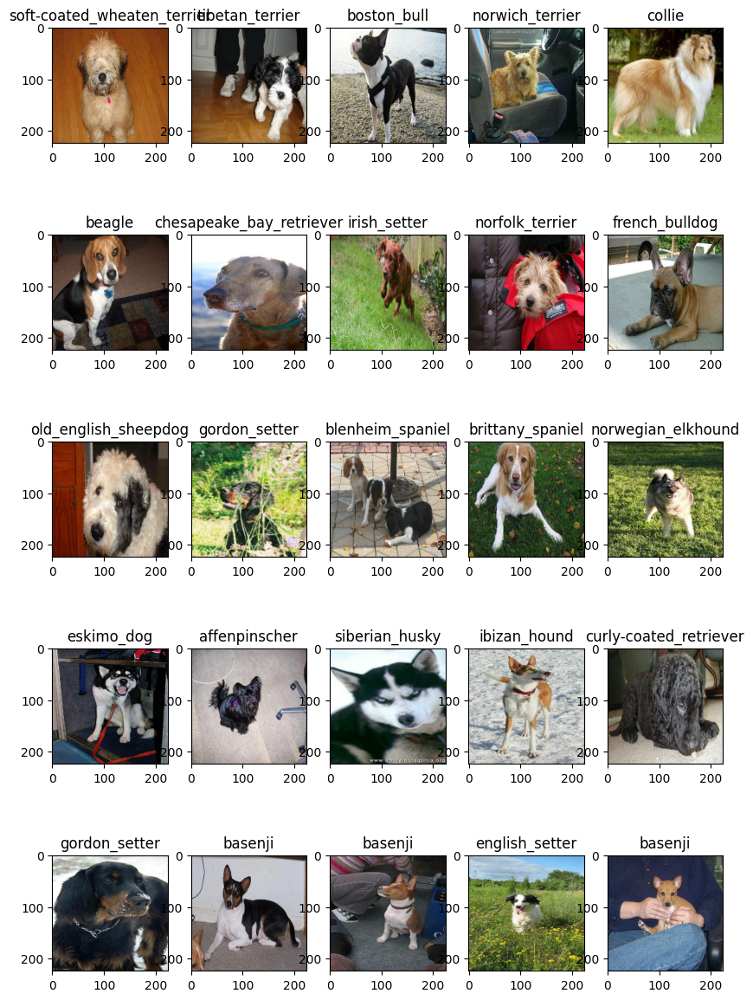

In [ ]:
# Now visualize data in training btch
show_25_images(train_images,train_labels) # because of shuffle images differs

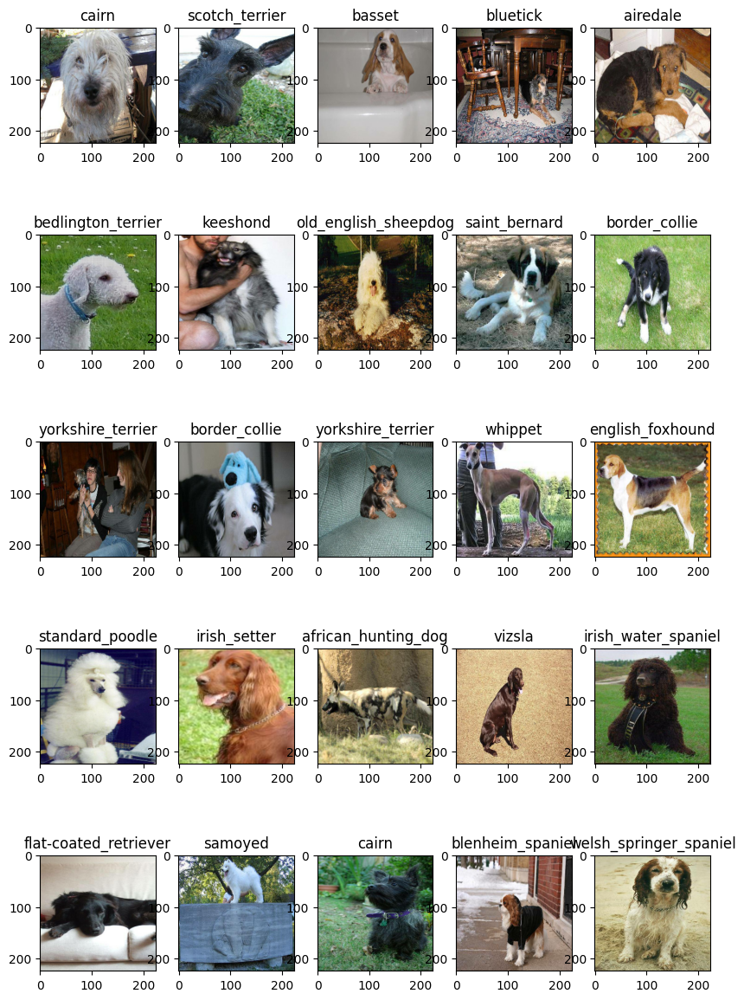

In [ ]:
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Buliding a Model

Before we build model, there are few thimg to define:
* The input shape(our image shape,in form of Tensors) to our model
* The output shape(image labels,in the form of Tensors) of our model
* The URL of the model we want to use

In [ ]:
# Set up input shape to the model
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3] # batch,height,width,colour channel

# Setup output shape of our model
OUTPUT_SHAPE=len(unique_breed)

# Setup Model URL from TensorFlow Hub
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we have inputs output and model ready to go.
Lets put them together into Keras deep lerning model

Let's create a function which
1. Takes the input shape, output shape and the model we have chosen as parameters.
2. Define a layers in a Keras model in sequential fashion.
3. Compile the model(says it should be evaluated and imporoved).
4. Build the model (tells the model the input shape it'll be getting)
5. return the model.

In [ ]:
# Create a function to build Keras model

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building Model with:", MODEL_URL)

  # Set up the model layers
  model=tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), #Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax")# Layer 2(output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model


In [ ]:
model=create_model()
model.summary()

Building Model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_3 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_3 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating Callbacks
Callbacks are helper functiom a model can use during training to do sunch things as it saves the progress, check its progress or stop training early if a model stops improving

We will create two callback
1. TensorBoard which helps track our models progress
2. Another for early stopping which prevents our model from training too long

 ### TensorBoard Callbacks

 1. Load the TensorBoard notebook extension
 2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our models's `fit` function
 3. Visyualize our models training logs with the `%tensorboard` magic function

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import datetime
# Create a function to build TensorBoard Callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir=os.path.join("drive/MyDrive/DogVison/dog-breed-identification/logs",
                      # Make it so the logs get tracked whenever we run an experiment
                      datetime.datetime.now().strftime('%Y%m%d-H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback
It helps our model in Preventing Overfitting by stopping training if certain evaluation metric stops improving

In [ ]:
# Create early stopping callback
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                patience=3)

## Training a model
Our first model is only to train on 1000 image to make sure everything

In [ ]:
NUM_EPOCHS=100 #@param {type:"slider",min:10,max:100,step:10}


In [ ]:
print("GPU","available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


Lets create a function which train a model

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data,validation data,number of epochs and the callbacks we did like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  # Create a model
  model=create_model()
  # Create new TensorBoard session everytime we train a model
  tensorboard=create_tensorboard_callback()
  # Fit the modle to data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  return model


In [ ]:
# Fit the model to data
model=train_model()

Building Model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 19s 391ms/step - loss: 4.5500 - accuracy: 0.0988 - val_loss: 3.4043 - val_accuracy: 0.2500
Epoch 2/100
25/25 [==============================] - 4s 149ms/step - loss: 1.5907 - accuracy: 0.7038 - val_loss: 2.1982 - val_accuracy: 0.5200
Epoch 3/100
25/25 [==============================] - 3s 117ms/step - loss: 0.5329 - accuracy: 0.9463 - val_loss: 1.7010 - val_accuracy: 0.5900
Epoch 4/100
25/25 [==============================] - 3s 117ms/step - loss: 0.2411 - accuracy: 0.9887 - val_loss: 1.4995 - val_accuracy: 0.6650
Epoch 5/100
25/25 [==============================] - 4s 169ms/step - loss: 0.1394 - accuracy: 0.9975 - val_loss: 1.4176 - val_accuracy: 0.6750
Epoch 6/100
25/25 [==============================] - 3s 126ms/step - loss: 0.0953 - accuracy: 1.0000 - val_loss: 1.3678 - val_accuracy: 0.6750
Epoch 7/100
25/25 [=============================

## Checking the TensorBoard logs
The Tensorboard magic function `%tensorboard` will access log we created directly and visualize its content

In [ ]:
model_2=train_model()

Building Model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 8s 132ms/step - loss: 4.5230 - accuracy: 0.1050 - val_loss: 3.2715 - val_accuracy: 0.2950
Epoch 2/100
25/25 [==============================] - 4s 172ms/step - loss: 1.6097 - accuracy: 0.7088 - val_loss: 2.0701 - val_accuracy: 0.5150
Epoch 3/100
25/25 [==============================] - 3s 115ms/step - loss: 0.5527 - accuracy: 0.9400 - val_loss: 1.5720 - val_accuracy: 0.6200
Epoch 4/100
25/25 [==============================] - 3s 121ms/step - loss: 0.2471 - accuracy: 0.9850 - val_loss: 1.4099 - val_accuracy: 0.6600
Epoch 5/100
25/25 [==============================] - 4s 143ms/step - loss: 0.1429 - accuracy: 0.9975 - val_loss: 1.3235 - val_accuracy: 0.6700
Epoch 6/100
25/25 [==============================] - 3s 116ms/step - loss: 0.0988 - accuracy: 1.0000 - val_loss: 1.2992 - val_accuracy: 0.6650
Epoch 7/100
25/25 [==============================

In [ ]:
# %tensorboard --logdir drive/MyDrive/DogVision/dog-breed-identification/logs

In [ ]:
# !kill 10926

In [ ]:
%tensorboard --logdir drive/MyDrive/DogVison/dog-breed-identification/logs

Reusing TensorBoard on port 6006 (pid 13522), started 0:42:25 ago. (Use '!kill 13522' to kill it.)

<IPython.core.display.Javascript object>

## Making and Evaluating Prediction using a trained model

In [ ]:
# make prediction on validation data
prediction=model.predict(val_data, verbose=1)
prediction

7/7 [==============================] - 6s 119ms/step


array([[1.0635630e-03, 1.6489495e-04, 6.9110381e-04, ..., 1.4641242e-04,
        2.1191121e-05, 3.0700013e-03],
       [1.0959755e-03, 6.4730644e-04, 1.1986733e-03, ..., 9.5577090e-04,
        2.9980026e-03, 3.5303022e-04],
       [7.4098745e-05, 4.8856484e-05, 8.5098312e-05, ..., 1.1221457e-04,
        8.8310611e-05, 6.6791091e-04],
       ...,
       [1.1549220e-04, 3.4780361e-04, 3.8748442e-03, ..., 4.1618012e-05,
        7.6550816e-04, 6.3940568e-04],
       [4.2462964e-03, 2.6169093e-04, 6.2761427e-04, ..., 1.2690018e-04,
        2.5002085e-04, 6.8368032e-03],
       [4.3744856e-04, 6.5054724e-06, 3.4040742e-04, ..., 1.4445299e-03,
        3.9612933e-04, 3.8954742e-05]], dtype=float32)

In [ ]:
prediction.shape

(200, 120)

In [ ]:
prediction[0]

array([1.06356305e-03, 1.64894955e-04, 6.91103807e-04, 1.19667675e-04,
       1.56562822e-03, 2.43009999e-04, 2.89103352e-02, 1.77682698e-04,
       1.31104069e-04, 1.85892277e-04, 1.14115851e-03, 7.20738244e-05,
       1.11933899e-04, 1.80418756e-05, 6.73115719e-04, 5.57188527e-04,
       1.49639687e-04, 1.20650783e-01, 5.45198691e-06, 1.68899845e-04,
       2.07942750e-04, 1.53210334e-04, 7.53310014e-05, 3.88341257e-04,
       5.90224045e-05, 9.26028879e-05, 1.38004109e-01, 1.70063024e-04,
       9.15459066e-04, 4.42041201e-04, 3.02421482e-04, 2.52567441e-03,
       7.22977391e-04, 4.84374323e-05, 1.33786598e-04, 3.25998105e-03,
       1.85444223e-04, 1.20521453e-03, 6.48025452e-05, 1.53967325e-04,
       5.57240390e-04, 1.02167505e-04, 2.28590470e-05, 1.70203930e-04,
       4.84828633e-05, 3.81175254e-04, 4.48191422e-05, 2.29431214e-04,
       1.64981553e-04, 2.71325116e-04, 3.40147759e-04, 6.16627358e-06,
       9.43911902e-04, 4.95091488e-04, 3.85124658e-05, 2.93391008e-06,
      

In [ ]:
prediction[0].argmax()

59

In [ ]:
unique_breed[26]

'cairn'

In [ ]:
import numpy as np
np.sum(prediction[0])

0.99999994

In [ ]:
index=42
print(prediction[index])
print(f"Max Value (probablity of prediction) : {np.max(prediction[index])}")
print(f"Sum : {np.sum(prediction[index])}")
print(f"Max Index : {np.argmax(prediction[index])}")
print(f"Predicted label : {unique_breed[np.argmax(prediction[index])]}")

[1.91649058e-04 5.64675793e-05 4.21669392e-05 2.28134650e-05
 1.56695081e-03 2.81386747e-04 1.06873937e-04 7.34983361e-04
 6.63877744e-03 9.21268910e-02 5.56760961e-06 2.27357418e-06
 4.31423658e-04 2.93671107e-03 1.50143285e-04 7.33733235e-04
 1.74813522e-05 6.19589584e-04 8.56054612e-05 6.75626448e-04
 4.70462655e-05 1.49888496e-04 4.97017099e-05 5.00888018e-05
 6.46758266e-03 5.41110530e-05 7.58175011e-05 5.38717723e-05
 2.10832455e-04 6.05438509e-05 6.77236894e-05 3.18267230e-05
 2.33860283e-05 1.80448005e-05 5.67856659e-05 2.05432516e-05
 2.04900847e-04 1.51746033e-04 2.00005943e-05 8.06812719e-02
 8.55328326e-05 6.11488431e-05 1.58374733e-03 8.23611936e-06
 4.70586092e-05 5.18290835e-05 3.48712783e-04 1.33248628e-04
 5.36551452e-05 8.32932201e-05 4.58849740e-04 8.98531507e-05
 1.19388518e-04 1.22141151e-03 1.08075692e-04 1.36221715e-04
 1.30168381e-04 7.42733173e-05 5.82879584e-05 3.49359871e-05
 1.55361631e-04 4.97265311e-04 1.45494523e-05 4.03944505e-05
 2.75382681e-05 5.954362

In [ ]:
# Turn prediction probablities into their respective label
def get_pred_label(prediction_probablities):
  return unique_breed[np.argmax(prediction_probablities)]

# get a predicted label based on an array of prediction probablities
pred_label=get_pred_label(prediction[82])
pred_label

'pekinese'

Now since our data is in a batch dataset, we have to unbatify it to make prediction on validation images and then compare those predictions to the validation label

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch the bathced validation data
images_=[]
labels_=[]

# Loop through unbatch data
for image,label in val_data.unbatch().as_numpy_iterator():
  # print(image)
  images_.append(image)
  labels_.append(label)
  # print(label)

In [ ]:
images_

[array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
labels_

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,  True,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
get_pred_label(labels_[48])

'miniature_poodle'

In [ ]:
get_pred_label(prediction[48])

'miniature_poodle'

In [ ]:
def unbatchify(data):
  images=[]
  labels=[]
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breed[np.argmax(label)])
  return images,labels

In [ ]:
val_images,val_labels=unbatchify(val_data)

In [ ]:
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
# get_pred_label(val_labels[0])

Now we have ways to get
1. Prediction label
2. Validation labels(truth labels)
3. Validation Images

Lets make a function to visualize a bit more

we will create a function which
*  Takes an array of prediction probablities, an array of truth labels and an array of images and integers.
* Convert the prediction probablities to a predicted label.
* Plot the predicted label, its predicted probablity, the truth label and thr truth image on a single plot

In [ ]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  pred_prob,true_label,image=prediction_probabilities[n],labels[n],images[n]
  # Get pred label
  pred_label=get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of title on prediction
  if pred_label==true_label:
    color="green"
  else:
    color="red"

  # Change the plot title to be predicted probablity of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)

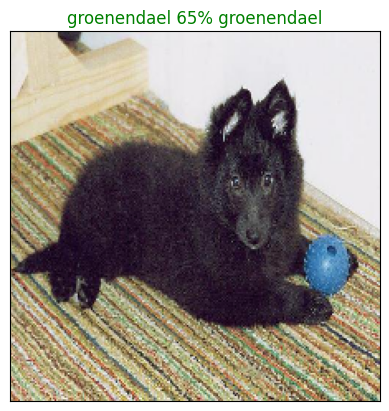

In [ ]:
plot_pred(prediction_probabilities=prediction,
          labels=val_labels,
          images=val_images,
          n=77)

Now we have one function to visualize model prediction lets make another to veiw top 10 prediction

The function will:
* Take an input of prediction probablities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * prediction probabilities index
  * prediction probabilities values
  * prediction labels
* Plot the top 10 prediction_probabilities values and labels,colouring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  pred_prob,true_label=prediction_probabilities[n],labels[n]
  # Get pred label
  pred_label=get_pred_label(pred_prob)

  # Find top 10 prediction confidence index
  top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values=pred_prob[top_10_pred_indexes]
  # Find top 10 prediction label
  top_10_pred_labels=unique_breed[top_10_pred_indexes]
  # Set up the plot
  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),
                   top_10_pred_values,
                   color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  # change color of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

In [ ]:
prediction[0].argsort()

array([ 55,  18,  51,  75, 115,  13, 118,  42,  94, 112, 108,  54,  46,
        33,  44, 113, 114,  61,  24,  38,  82,  11,  22,  99,  66, 101,
        25,  41,  63,  92,  12,   3,  85,   8,  34,  72, 117,  16,  64,
        21,  39,   1,  48,  19,  27,  43,   7, 105,  36,   9,  80,  91,
        20,  56, 111,  87,  47,   5,  71,  49,  67,  30,  50,  45,  23,
        29, 107,  53,  15,  40,  88,  58,  14,   2,  32,  86,  84,  28,
        96,  52,  93,  95,  69,   0,  81,  10,  37,  78,  60, 104,  98,
         4,  74,  76,  97,  89, 110,  62,  90,  31, 119,  35, 116, 106,
       102,  77,  57, 109,  68, 100,  79,  70,  83,   6,  73,  65, 103,
        17,  26,  59])

In [ ]:
prediction[0].argsort()[-10:][::-1]

array([ 59,  26,  17, 103,  65,  73,   6,  83,  70,  79])

In [ ]:
prediction[0][prediction[0].argsort()[-10:][::-1]]

array([0.32277954, 0.13800411, 0.12065078, 0.07815206, 0.06207448,
       0.03379123, 0.02891034, 0.02886791, 0.01921397, 0.01867551],
      dtype=float32)

In [ ]:
unique_breed[prediction[0].argsort()[-10:][::-1]]

array(['irish_wolfhound', 'cairn', 'border_terrier',
       'soft-coated_wheaten_terrier', 'komondor', 'maltese_dog',
       'australian_terrier', 'otterhound', 'lhasa', 'norfolk_terrier'],
      dtype=object)

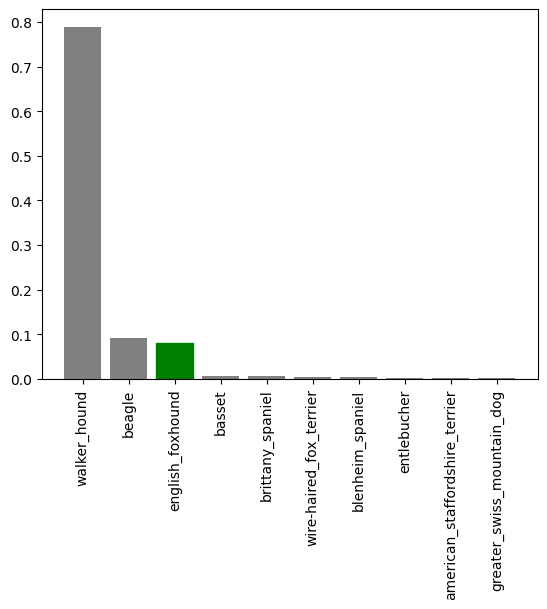

In [ ]:
plot_pred_conf(prediction_probabilities=prediction,
               labels=val_labels,
               n=42)

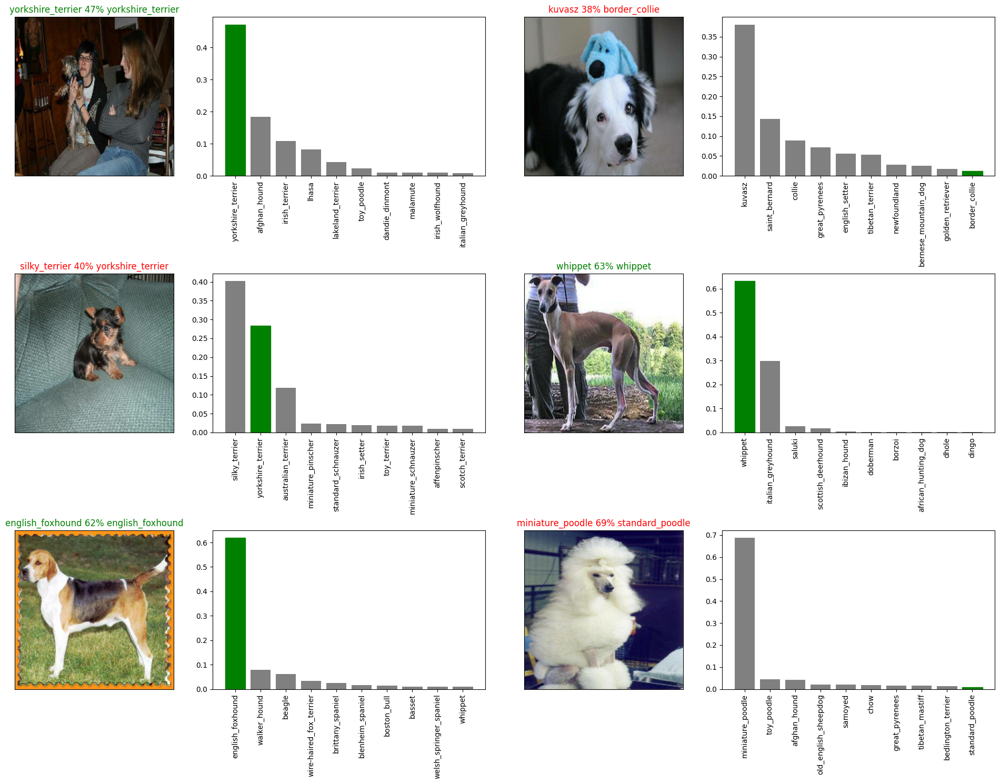

In [ ]:
# Lets check out few prediction and their different value
i_multiplier=10
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=prediction,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=prediction,
               labels=val_labels,
               n=i+i_multiplier)
  plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading the model

In [ ]:
# Create afunction to save a model
def save_model(model,suffix=None):
  # Create a model directory
  modeldir=os.path.join("drive/MyDrive/DogVision/dog-breed-identification/models",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path=modeldir+"-"+suffix+".h5"
  print(f"Saving model to:{model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):
  print(f"Loading model from{model_path}...")
  model=tf.keras.models.load_model(model_path,
                                   custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model,suffix="1000-images-mobilenetv2-Adam")

Saving model to:drive/MyDrive/DogVision/dog-breed-identification/models/20230703-16061688400392-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/DogVision/dog-breed-identification/models/20230703-16061688400392-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load trained model
loaded_1000_image_model=load_model("drive/MyDrive/DogVision/dog-breed-identification/models/20230703-16061688400392-1000-images-mobilenetv2-Adam.h5")

Loading model fromdrive/MyDrive/DogVision/dog-breed-identification/models/20230703-16061688400392-1000-images-mobilenetv2-Adam.h5...


In [ ]:
#Evaluate it
model.evaluate(val_data)

7/7 [==============================] - 1s 109ms/step - loss: 1.3246 - accuracy: 0.6750


[1.324649691581726, 0.675000011920929]

In [ ]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 3s 154ms/step - loss: 1.3246 - accuracy: 0.6750


[1.324649691581726, 0.675000011920929]

Now we have train the model on full data

In [ ]:
len(X),len(y)

(10222, 10222)

In [ ]:
# Create a data batch with full dataset
full_data=create_data_batches(X,y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a full model
full_model=create_model()

Building Model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callabacks
full_model_tensorboard=create_tensorboard_callback()
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                           patience=3)

In [ ]:
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 40s 105ms/step - loss: 1.3511 - accuracy: 0.6715
Epoch 2/100
320/320 [==============================] - 34s 107ms/step - loss: 0.4026 - accuracy: 0.8805
Epoch 3/100
320/320 [==============================] - 48s 150ms/step - loss: 0.2358 - accuracy: 0.9377
Epoch 4/100
320/320 [==============================] - 34s 105ms/step - loss: 0.1528 - accuracy: 0.9645
Epoch 5/100
320/320 [==============================] - 38s 120ms/step - loss: 0.1061 - accuracy: 0.9783
Epoch 6/100
320/320 [==============================] - 33s 104ms/step - loss: 0.0766 - accuracy: 0.9870
Epoch 7/100
320/320 [==============================] - 34s 106ms/step - loss: 0.0593 - accuracy: 0.9903
Epoch 8/100
320/320 [==============================] - 34s 105ms/step - loss: 0.0458 - accuracy: 0.9944
Epoch 9/100
320/320 [==============================] - 33s 104ms/step - loss: 0.0375 - accuracy: 0.9965
Epoch 10/100
320/320 [==============================] - 33s 103m

In [ ]:
save_model(full_model,suffix="full-images-set-mobilenetv2-Adam")

Saving model to:drive/MyDrive/DogVision/dog-breed-identification/models/20230703-16271688401668-full-images-set-mobilenetv2-Adam.h5...


'drive/MyDrive/DogVision/dog-breed-identification/models/20230703-16271688401668-full-images-set-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model=load_model("drive/MyDrive/DogVision/dog-breed-identification/models/20230703-16271688401668-full-images-set-mobilenetv2-Adam.h5")

Loading model fromdrive/MyDrive/DogVision/dog-breed-identification/models/20230703-16271688401668-full-images-set-mobilenetv2-Adam.h5...


## Making Prediction on test dataset

In [ ]:
#Laod test images filename
test_path="drive/MyDrive/DogVision/dog-breed-identification/test/"
test_filenames=[test_path+fname for fname in os.listdir(test_path)]
test_filenames

['drive/MyDrive/DogVision/dog-breed-identification/test/e2faaf5e760a6189d0980e6355864b4c.jpg',
 'drive/MyDrive/DogVision/dog-breed-identification/test/e1c6c50bbaee219e7faf29e9c1c343ca.jpg',
 'drive/MyDrive/DogVision/dog-breed-identification/test/e119301e11d4f1620948c3e6f5a3f021.jpg',
 'drive/MyDrive/DogVision/dog-breed-identification/test/e6d6ff5b33e6174158d5ab05a7eda95c.jpg',
 'drive/MyDrive/DogVision/dog-breed-identification/test/e1ada9b155a5903bc6475255d012f681.jpg',
 'drive/MyDrive/DogVision/dog-breed-identification/test/def639bab46dfc714234180be730ef49.jpg',
 'drive/MyDrive/DogVision/dog-breed-identification/test/e079440ee0061b92ec22faf17be13908.jpg',
 'drive/MyDrive/DogVision/dog-breed-identification/test/e18c30f7ba3680d75ff326ccb71642e0.jpg',
 'drive/MyDrive/DogVision/dog-breed-identification/test/e1f25b73300a49b61a7690239fe37b38.jpg',
 'drive/MyDrive/DogVision/dog-breed-identification/test/e1f7ec4bd372612f53411026aaabf233.jpg',
 'drive/MyDrive/DogVision/dog-breed-identification

In [ ]:
len(test_filenames)

10357

In [ ]:
test_data=create_data_batches(test_filenames,test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make prediction on test data batch using loaded full model
# test_predictions=loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 236s 693ms/step


In [ ]:
# np.savetxt("drive/MyDrive/DogVision/dog-breed-identification/preds_arrays.csv",test_predictions,delimiter=",")

In [ ]:
# test_predictions

array([[1.2488552e-07, 1.1123332e-05, 4.2732640e-06, ..., 2.4499502e-07,
        1.4529326e-05, 3.4216573e-06],
       [9.9939883e-01, 5.2705906e-09, 8.7265327e-11, ..., 5.7104869e-13,
        8.1348137e-11, 2.6654609e-05],
       [7.9480429e-08, 6.1702705e-11, 4.2379607e-12, ..., 1.6688945e-08,
        6.8998793e-07, 1.4012329e-05],
       ...,
       [1.1664310e-12, 4.0044007e-10, 1.7672568e-06, ..., 3.1682187e-10,
        2.5307865e-09, 5.4499322e-12],
       [9.9701762e-01, 2.5587849e-07, 1.9288770e-07, ..., 1.5252531e-09,
        1.1573669e-06, 4.6763707e-06],
       [2.6664312e-08, 2.7519373e-09, 3.4541412e-08, ..., 2.7778610e-10,
        1.0118191e-06, 8.6720373e-09]], dtype=float32)

In [ ]:
# len(test_predictions)

10357

In [ ]:
test_prediction=np.loadtxt("drive/MyDrive/DogVision/dog-breed-identification/preds_arrays.csv",delimiter=",")

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing prediction for submitting to kaggle

In [ ]:
# Craete a pandas dataframe
preds_df=pd.DataFrame(columns=["id"]+list(unique_breed))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image id to prediction dataframe
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]

In [ ]:
os.path.splitext(test_filenames[0])

('drive/MyDrive/DogVision/dog-breed-identification/test/e2faaf5e760a6189d0980e6355864b4c',
 '.jpg')

In [ ]:
test_ids

['e2faaf5e760a6189d0980e6355864b4c',
 'e1c6c50bbaee219e7faf29e9c1c343ca',
 'e119301e11d4f1620948c3e6f5a3f021',
 'e6d6ff5b33e6174158d5ab05a7eda95c',
 'e1ada9b155a5903bc6475255d012f681',
 'def639bab46dfc714234180be730ef49',
 'e079440ee0061b92ec22faf17be13908',
 'e18c30f7ba3680d75ff326ccb71642e0',
 'e1f25b73300a49b61a7690239fe37b38',
 'e1f7ec4bd372612f53411026aaabf233',
 'e5c0666aa15120eba4718ae947a52c45',
 'ea1993074afd8a51c571bb0f733a754d',
 'f2081ded3fa95eb118ff88b7eaad992e',
 'f33e07d0a4dac780e19f00818752db55',
 'f41a03e617bde76fef19ec1cf1355d59',
 'f0b2e9d1bf7deeb89dd199177f2fda90',
 'ee59d7c0fdd2344e9d6d815f1099ffb1',
 'f13011a399f175d88c17d2bd1785625e',
 'f53ae57b0cae92b14f87716a815d66e9',
 'eaacea894e9bdda125ae215081a0d9fc',
 'ed67681e7935d75f9ce011dbf8474fe4',
 'e9f806911b69ca8fe705006ab7b49bdf',
 'ec9a95ba1bab38eeff6b6aa40d5f4edf',
 'efdf443fb4a6ad5964c18d6676f36652',
 'f3d4b8b4cd50260c89a6d5b29a7e9243',
 'f4a3d9cf1909fb5d894ff5d5121af9b0',
 'f39a1f1692b67eb9c92a29f14a07d568',
 

In [ ]:
preds_df["id"]=test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e2faaf5e760a6189d0980e6355864b4c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e1c6c50bbaee219e7faf29e9c1c343ca,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e119301e11d4f1620948c3e6f5a3f021,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e6d6ff5b33e6174158d5ab05a7eda95c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e1ada9b155a5903bc6475255d012f681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add prediction probablities to each breed colum
preds_df[list(unique_breed)]= test_predictions

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e2faaf5e760a6189d0980e6355864b4c,1.248855e-07,1.112333e-05,4.273264e-06,1.796004e-06,5.388837e-08,5.022465e-08,1.095647e-08,6.145178e-10,1.220702e-07,...,6.918094e-11,2.284744e-07,1.788779e-07,1.548924e-01,2.777205e-06,4.064534e-07,1.515137e-03,2.449950e-07,1.452933e-05,3.421657e-06
1,e1c6c50bbaee219e7faf29e9c1c343ca,9.993988e-01,5.270591e-09,8.726533e-11,2.217334e-12,2.638035e-13,1.871257e-13,6.720275e-09,1.891334e-12,3.159853e-11,...,2.734355e-07,1.297456e-12,1.235189e-09,3.782206e-13,7.977259e-11,1.243792e-13,1.487277e-12,5.710487e-13,8.134814e-11,2.665461e-05
2,e119301e11d4f1620948c3e6f5a3f021,7.948043e-08,6.170271e-11,4.237961e-12,3.415311e-03,4.852006e-07,1.634916e-10,1.315945e-09,1.342737e-08,3.986806e-11,...,3.182222e-04,1.402060e-08,3.978062e-08,2.066919e-08,2.282609e-09,1.124101e-08,2.047939e-10,1.668895e-08,6.899879e-07,1.401233e-05
3,e6d6ff5b33e6174158d5ab05a7eda95c,2.106336e-10,3.616957e-08,1.101976e-12,1.387233e-11,4.516326e-10,5.671915e-12,1.622559e-09,3.347376e-13,2.153807e-11,...,2.576786e-11,5.133779e-14,1.580836e-13,2.580799e-08,5.475321e-11,2.418931e-11,2.231085e-12,1.169875e-11,1.564946e-11,1.003838e-13
4,e1ada9b155a5903bc6475255d012f681,2.696505e-06,1.397101e-08,8.808634e-12,1.302958e-06,7.066818e-09,1.211063e-12,4.686624e-07,2.402655e-08,6.838098e-07,...,3.496483e-06,2.389260e-07,9.551858e-08,5.147876e-06,1.000776e-07,8.968511e-10,1.847683e-08,1.062276e-08,2.593403e-02,1.726844e-05


In [ ]:
preds_df.to_csv("drive/MyDrive/DogVision/dog-breed-identification/full_model_prediction_submission_1_mobilenetv2.csv",index=False)

## Custom images

In [ ]:
custom_path="drive/MyDrive/DogVision/dog-breed-identification/custom_images/"
custom_image_paths=[custom_path+fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/DogVision/dog-breed-identification/custom_images/dog-pic-3.jpg',
 'drive/MyDrive/DogVision/dog-breed-identification/custom_images/dog-pic-2.jpg',
 'drive/MyDrive/DogVision/dog-breed-identification/custom_images/dog-pic-1.jpg',
 'drive/MyDrive/DogVision/dog-breed-identification/custom_images/.ipynb_checkpoints']

In [ ]:
# Turn custom images to data batchsets
custom_data=create_data_batches(custom_image_paths[0:len(custom_image_paths)-1],test_data=True)

Creating test data batches...


In [ ]:
custom_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
 custom_preds=loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 551ms/step


In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
custom_pred_labels=[get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['pembroke', 'siberian_husky', 'golden_retriever']

In [ ]:
custom_images=[] # Get custom images
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

In [ ]:
custom_images

[array([[[0.3262255 , 0.31446078, 0.27916667],
         [0.33553922, 0.32377452, 0.2884804 ],
         [0.34301472, 0.33125   , 0.2959559 ],
         ...,
         [0.16470589, 0.16470589, 0.16470589],
         [0.16188726, 0.16188726, 0.16188726],
         [0.16078432, 0.16078432, 0.16078432]],
 
        [[0.32880366, 0.31703895, 0.28174484],
         [0.33553922, 0.32377452, 0.2884804 ],
         [0.34168118, 0.32991648, 0.29462236],
         ...,
         [0.16470589, 0.16470589, 0.16470589],
         [0.16188726, 0.16188726, 0.16188726],
         [0.16078432, 0.16078432, 0.16078432]],
 
        [[0.3338342 , 0.3220695 , 0.28677538],
         [0.33706808, 0.32530338, 0.29000926],
         [0.3401794 , 0.3284147 , 0.2931206 ],
         ...,
         [0.16470589, 0.16470589, 0.16470589],
         [0.16188726, 0.16188726, 0.16188726],
         [0.16078432, 0.16078432, 0.16078432]],
 
        ...,
 
        [[0.27544728, 0.4127022 , 0.19309433],
         [0.30647808, 0.44152713, 0.22081

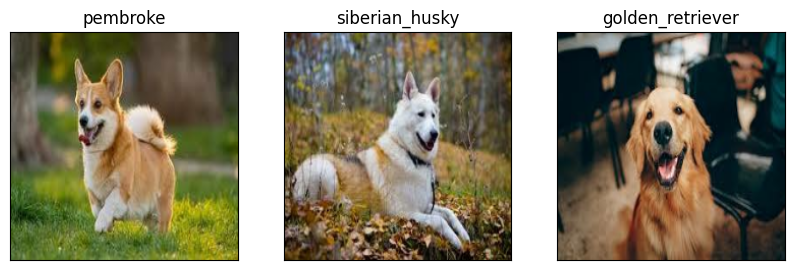

In [ ]:
# Check custom predictions
plt.figure(figsize=(10,10))
for i,image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)